In [ ]:
!pip install transformers datasets sentencepiece rouge-score

import torch
from transformers import BartForConditionalGeneration, BartTokenizer, Trainer, TrainingArguments
from datasets import load_dataset
import numpy as np
from rouge_score import rouge_scorer


  Preparing metadata (setup.py) ... done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=3c62c9dc4d0e3efc9f8b4964c12f8b6129a14b480c39e05b7e2a0156e964b0e3
  Stored in directory: /root/.cache/pip/wheels/1e/19/43/8a442dc83660ca25e163e1bd1f89919284ab0d0c1475475148
Successfully built rouge-score


In [ ]:
from datasets import Dataset
import pandas as pd
from google.colab import files

# Upload CSV
uploaded = files.upload()  # Choosing cleaned dataset file (from baseline)
csv_filename = list(uploaded.keys())[0]

# Loading dataset
df = pd.read_csv(csv_filename)  # Must have 'text' and 'summary' columns
print("Dataset preview:")
print(df.head())

# Converting to HuggingFace Dataset
dataset = Dataset.from_pandas(df)

# Train/validation split
dataset = dataset.train_test_split(test_size=0.1, seed=42)
train_dataset = dataset["train"]
val_dataset = dataset["test"]

print(f"Train size: {len(train_dataset)}")
print(f"Validation size: {len(val_dataset)}")


Saving cleaned_dataset.csv to cleaned_dataset.csv
Dataset preview:
                                                 URL  \
0  https://www.moneycontrol.com/news/business/eco...   
1  https://www.businesstoday.in/top-story/state-r...   
2  https://www.financialexpress.com/economy/covid...   
3  https://www.moneycontrol.com/news/business/mar...   
4  https://www.financialexpress.com/industry/six-...   

                                             Content  \
0  us consumer spending dropped by a record in ap...   
1  state-run lenders require an urgent rs 1.2 tri...   
2  apparel exporters on wednesday urged the gover...   
3  asian shares battled to extend a global reboun...   
4  after india's sovereign credit rating fell to ...   

                                             Summary Sentiment  
0  consumer spending plunges 13.6 percent in apri...  Negative  
1  government will have to take a bulk of the tab...  Negative  
2  exporters are facing issues in terms of raw ma...  Negative  

In [ ]:
from transformers import AutoTokenizer

# Picking a fast, good baseline for tonight
MODEL_NAME = "sshleifer/distilbart-cnn-12-6"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, use_fast=True)

MAX_INPUT_LEN = 512
MAX_TARGET_LEN = 72

def preprocess(batch):

    inputs = tokenizer(
        batch["Content"],
        max_length=MAX_INPUT_LEN,
        truncation=True,
        padding="max_length",
    )
    with tokenizer.as_target_tokenizer():
        labels = tokenizer(
            batch["Summary"],
            max_length=MAX_TARGET_LEN,
            truncation=True,
            padding="max_length",
        )
    inputs["labels"] = labels["input_ids"]
    return inputs

# Removing the existing columns generically to avoid mismatches
train_dataset_tok = train_dataset.map(preprocess, batched=True, remove_columns=train_dataset.column_names)
val_dataset_tok   = val_dataset.map(preprocess,   batched=True, remove_columns=val_dataset.column_names)

train_dataset_tok, val_dataset_tok


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

Map:   0%|          | 0/23609 [00:00<?, ? examples/s]

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:4006: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(


Map:   0%|          | 0/2624 [00:00<?, ? examples/s]

(Dataset({
     features: ['input_ids', 'attention_mask', 'labels'],
     num_rows: 23609
 }),
 Dataset({
     features: ['input_ids', 'attention_mask', 'labels'],
     num_rows: 2624
 }))

In [ ]:
from transformers import AutoModelForSeq2SeqLM

MODEL_NAME = "sshleifer/distilbart-cnn-12-6"  # same as tokenizer
model = AutoModelForSeq2SeqLM.from_pretrained(MODEL_NAME)


pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

In [ ]:
from transformers import DataCollatorForSeq2Seq
from rouge_score import rouge_scorer
import numpy as np

data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

scorer = rouge_scorer.RougeScorer(["rouge1","rouge2","rougeLsum"], use_stemmer=True)

def compute_metrics(eval_pred):
    preds, labels = eval_pred
    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)
    r1=r2=rl=0.0
    n = len(decoded_preds)
    for p, r in zip(decoded_preds, decoded_labels):
        s = scorer.score(r, p)
        r1 += s["rouge1"].fmeasure; r2 += s["rouge2"].fmeasure; rl += s["rougeLsum"].fmeasure
    return {"rouge1": r1/n, "rouge2": r2/n, "rougeL": rl/n}


In [ ]:
# Training setup (step-based for older Transformers, wandb disabled)
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments

args = Seq2SeqTrainingArguments(
    output_dir="distilbart-finnews",
    do_train=True,
    do_eval=True,

    # Batch sizes
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=2,

    num_train_epochs=2,
    learning_rate=5e-5,
    weight_decay=0.01,

    # Step-based logging/eval/save (used in older versions)
    logging_steps=200,
    eval_steps=1000,
    save_steps=1000,
    save_total_limit=2,

    # Generation + mixed precision
    predict_with_generate=True,
    fp16=True,

    # Disable wandb/tensorboard
    report_to=[],
    logging_dir="./logs"
)

trainer = Seq2SeqTrainer(
    model=model,
    args=args,
    train_dataset=train_dataset_tok,
    eval_dataset=val_dataset_tok,
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)


/tmp/ipython-input-187449797.py:33: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


In [ ]:
# === Block 7: Train ===
train_result = trainer.train()

# Print a compact summary
print({k: float(v) for k, v in getattr(train_result, "metrics", {}).items()})

# Persist trainer state/metrics locally
trainer.save_state()


Step,Training Loss
200,0.273100
400,0.483900
600,0.435700
800,0.393000
1000,0.368800
1200,0.331500
1400,0.303000
1600,0.231000
1800,0.185900
2000,0.174800


/usr/local/lib/python3.11/dist-packages/transformers/modeling_utils.py:3909: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 142, 'min_length': 56, 'early_stopping': True, 'num_beams': 4, 'length_penalty': 2.0, 'no_repeat_ngram_size': 3, 'forced_bos_token_id': 0}. You are seeing this warning because you've set generation parameters in the model config, as opposed to in the generation config.
  warnings.warn(


{'train_runtime': 608.9376, 'train_samples_per_second': 77.542, 'train_steps_per_second': 4.848, 'total_flos': 3.654465642666394e+16, 'train_loss': 0.2657281648175826, 'epoch': 2.0}


In [ ]:
# Tie generation params to generation_config to avoid the warning
gc = model.generation_config
gc.max_length = 72
gc.min_length = 16
gc.early_stopping = True
gc.num_beams = 4
gc.length_penalty = 1.0
gc.no_repeat_ngram_size = 3

# Reattach for safety (older transformers sometimes ignore in-place changes)
model.generation_config = gc

# Evaluate on validation set
val_metrics = trainer.evaluate(val_dataset_tok)
print({k: float(v) for k, v in val_metrics.items()})


{'eval_loss': 0.2146356701850891, 'eval_rouge1': 0.7220399238779489, 'eval_rouge2': 0.6329234326081488, 'eval_rougeL': 0.6740281516562868, 'eval_runtime': 469.8688, 'eval_samples_per_second': 5.585, 'eval_steps_per_second': 0.698, 'epoch': 2.0}


In [ ]:

save_dir = "Model_04_version_01"

# Save model, tokenizer, and config files
trainer.save_model(save_dir)           # Saves model weights + training args
tokenizer.save_pretrained(save_dir)    # Saves vocab + tokenizer config
model.config.save_pretrained(save_dir) # Saves model architecture/config
model.generation_config.save_pretrained(save_dir)  # Saves generation params

# Zip the entire directory
import shutil
zip_path = f"/content/{save_dir}.zip"
shutil.make_archive(zip_path.replace(".zip", ""), 'zip', save_dir)

# Download to local machine
from google.colab import files
files.download(zip_path)

print(f"✅ Packed and ready: {zip_path}")
print("You can load it with:")
print(f'''
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

tokenizer = AutoTokenizer.from_pretrained("{save_dir}")
model = AutoModelForSeq2SeqLM.from_pretrained("{save_dir}")
''')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Packed and ready: /content/Model_04_version_01.zip
You can load it with:

from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

tokenizer = AutoTokenizer.from_pretrained("Model_04_version_01")
model = AutoModelForSeq2SeqLM.from_pretrained("Model_04_version_01")



In [ ]:

import torch, numpy as np
from tqdm.auto import tqdm
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
from rouge_score import rouge_scorer

SAVE_DIR = "Model_04_version_01"
device = "cuda" if torch.cuda.is_available() else "cpu"

# 1) Load portable artifacts
tok = AutoTokenizer.from_pretrained(SAVE_DIR, use_fast=True)
mdl = AutoModelForSeq2SeqLM.from_pretrained(SAVE_DIR).to(device).eval()

# 2) Generation config (kept conservative to match training)
gen_kwargs = dict(
    max_length=72,
    min_length=16,
    num_beams=4,
    no_repeat_ngram_size=3,
    length_penalty=1.0,
    early_stopping=True,
)

# 3) Prepare ROUGE scorer
scorer = rouge_scorer.RougeScorer(["rouge1","rouge2","rougeLsum"], use_stemmer=True)

# 4) Run batched inference on validation set
BATCH_SIZE = 16
texts = val_dataset["Content"]
refs  = val_dataset["Summary"]

preds = []
for i in tqdm(range(0, len(texts), BATCH_SIZE)):
    batch_texts = texts[i:i+BATCH_SIZE]
    batch = tok(batch_texts, max_length=512, truncation=True, return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        out = mdl.generate(**batch, **gen_kwargs)
    batch_preds = tok.batch_decode(out, skip_special_tokens=True)
    preds.extend(batch_preds)

# 5) Compute ROUGE (F1)
r1=r2=rl=0.0
for p, r in zip(preds, refs):
    s = scorer.score(r, p)
    r1 += s["rouge1"].fmeasure; r2 += s["rouge2"].fmeasure; rl += s["rougeLsum"].fmeasure
n = len(preds)
metrics = {"rouge1": r1/n, "rouge2": r2/n, "rougeL": rl/n}
print("Validation ROUGE:", {k: round(v, 4) for k,v in metrics.items()})

# 6) Show a few samples
for j in range(3):
    k = np.random.randint(0, len(texts))
    print("\n--- SAMPLE", j+1, "---")
    print("SOURCE :", texts[k][:400].replace("\n"," "))
    print("REF    :", refs[k])
    print("PRED   :", preds[k])


/usr/local/lib/python3.11/dist-packages/transformers/models/bart/configuration_bart.py:177: UserWarning: Please make sure the config includes `forced_bos_token_id=0` in future versions. The config can simply be saved and uploaded again to be fixed.
  warnings.warn(


  0%|          | 0/164 [00:00<?, ?it/s]

Validation ROUGE: {'rouge1': 0.6929, 'rouge2': 0.6036, 'rougeL': 0.6439}

--- SAMPLE 1 ---
SOURCE : elevate your tech prowess with high-value skill courses offering college course website northwestern university kellogg post graduate certificate in product management visit indian school of business isb professional certificate in product management visit iim lucknow iiml executive programme in fintech, banking & applied risk management visit bengaluru: indian it firms are likely to persist with 
REF    : it firms likely to continue with ongoing digital transformation projects that save costs. some large clients have continued discretionary spending on digital technology transformation. top tier software services exporters such as infosys and wipro reported 40.6% and 39.8% revenue. a number of large clients have continued discretionary spending on digital transformation. a number of large clients have continued discretionary spending on digital transformation.
PRED   : it firms likely t

In [ ]:

# Expects: clip_images.rar (or .zip), clip_image_index.pt, missed_keywords.txt, seen_hashes.txt, top_keywords.txt
import os, shutil, torch, json, sys, glob, subprocess
from google.colab import files

print("Selecting aLL image generation files: clip_images.rar/.zip, clip_image_index.pt, missed_keywords.txt, seen_hashes.txt, top_keywords.txt")
uploaded = files.upload()  # pick multiple files at once

# Save/rename into /content
for name, data in uploaded.items():
    with open(f"/content/{name}", "wb") as f:
        f.write(data)
print("✅ Files saved to /content")

# Create images dir
IMAGES_ROOT = "/content/clip_images"
os.makedirs(IMAGES_ROOT, exist_ok=True)

# Extract images (RAR or ZIP)
archive = None
candidates = ["/content/clip_images.rar", "/content/clip_images.zip"]
for c in candidates:
    if os.path.exists(c):
        archive = c
        break

if archive is None:
    print("⚠️ No clip_images archive found (clip_images.rar/zip). If images are already a folder, skip.")
else:
    if archive.endswith(".rar"):
        # install unrar only if needed
        try:
            subprocess.run(["unrar"], stdout=subprocess.PIPE, stderr=subprocess.PIPE, check=False)
        except Exception:
            pass
        !apt-get -y -qq install unrar >/dev/null
        !unrar x -o+ "/content/clip_images.rar" "/content/clip_images" >/dev/null
        print("✅ Extracted RAR into /content/clip_images")
    else:
        # ZIP
        !unzip -o "/content/clip_images.zip" -d "/content/clip_images" >/dev/null
        print("✅ Extracted ZIP into /content/clip_images")

# Locate the CLIP index
INDEX_PATH = "/content/clip_image_index.pt"
if not os.path.exists(INDEX_PATH):
    # try to find any *.pt if the filename differs
    pts = glob.glob("/content/*.pt")
    if len(pts) == 1:
        INDEX_PATH = pts[0]
        print(f"ℹ️ Using found index: {INDEX_PATH}")
    elif len(pts) > 1:
        print("⚠️ Multiple .pt files found, set INDEX_PATH to the correct one manually:")
        print("\n".join(pts))

# Quick integrity checks
if os.path.exists(INDEX_PATH):
    idx = torch.load(INDEX_PATH, map_location="cpu")
    assert "embeds" in idx and "paths" in idx, "Index must contain 'embeds' and 'paths'."
    print(f"✅ Index loaded: embeds {tuple(idx['embeds'].shape)}, paths: {len(idx['paths'])}")
else:
    print("❌ clip_image_index.pt not found. Upload it and re-run this cell.")

# Optional: load keyword helpers if your friend’s code uses them
paths = {
    "missed_keywords": "/content/missed_keywords.txt",
    "seen_hashes": "/content/seen_hashes.txt",
    "top_keywords": "/content/top_keywords.txt",
}
for label, p in paths.items():
    if os.path.exists(p):
        with open(p, "r", encoding="utf-8", errors="ignore") as f:
            head = "".join([next(f) for _ in range(5)]).strip()
        print(f"📄 {label}: found ({p}). First lines:\n{head[:200]}\n")
    else:
        print(f"ℹ️ {label} not provided (optional).")

# Normalize relative image paths to live under /content/clip_images
def resolve_image_path(p: str) -> str:
    p = p.strip()
    if os.path.isabs(p):
        return p
    return os.path.join(IMAGES_ROOT, p.lstrip("/"))

print("✅ Upload & extraction done. You can proceed to loading CLIP + running retrieval.")


Selecting aLL image generation files: clip_images.rar/.zip, clip_image_index.pt, missed_keywords.txt, seen_hashes.txt, top_keywords.txt


Saving clip_images.rar to clip_images.rar
Saving Image Retrieval.ipynb to Image Retrieval.ipynb
Saving clip_image_index.pt to clip_image_index.pt
Saving missed_keywords.txt to missed_keywords.txt
Saving seen_hashes.txt to seen_hashes.txt
Saving top_keywords.txt to top_keywords.txt
✅ Files saved to /content
✅ Extracted RAR into /content/clip_images


AssertionError: Index must contain 'embeds' and 'paths'.

In [ ]:
import torch, numpy as np

INDEX_PATH = "/content/clip_image_index.pt"
idx = torch.load(INDEX_PATH, map_location="cpu")
print("Type:", type(idx))

if isinstance(idx, dict):
    print("Keys:", list(idx.keys()))
    for k,v in idx.items():
        try:
            if hasattr(v, "shape"):
                print(f"  {k}: tensor/array shape {tuple(v.shape)}")
            elif isinstance(v, list):
                print(f"  {k}: list len {len(v)} (first 2 items: {v[:2]})")
            else:
                print(f"  {k}: {type(v)}")
        except Exception as e:
            print(f"  {k}: {type(v)} (error getting shape/preview: {e})")
else:
    print("Value preview:", str(idx)[:500])


Type: <class 'dict'>
Keys: ['embeddings', 'keywords']
  embeddings: tensor/array shape (4439, 512)
  keywords: list len 4439 (first 2 items: ['000mah', '100cc'])


In [ ]:

import torch, os, glob, re
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CLIP_NAME = "openai/clip-vit-base-patch32"  # 512-dim text/image features; matches index dim 512
clip_model = CLIPModel.from_pretrained(CLIP_NAME).to(device).eval()
clip_processor = CLIPProcessor.from_pretrained(CLIP_NAME)

INDEX_PATH = "/content/clip_image_index.pt"
idx = torch.load(INDEX_PATH, map_location="cpu")
assert "embeddings" in idx and "keywords" in idx, "Index must have 'embeddings' and 'keywords'."

img_embeds = idx["embeddings"].float()                # [N, 512]
keywords  = list(map(str, idx["keywords"]))           # [N]
assert img_embeds.ndim == 2 and img_embeds.shape[1] == 512 and len(keywords) == img_embeds.shape[0]
# L2-normalize (robust even if already normalized)
img_embeds = F.normalize(img_embeds, p=2, dim=-1).to(device)

print(f"Index loaded: embeddings={tuple(img_embeds.shape)}, keywords={len(keywords)}")


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Index loaded: embeddings=(4439, 512), keywords=4439


In [ ]:
# === Build a resolver from keyword -> image path under /content/clip_images ===
from pathlib import Path
from difflib import get_close_matches

IMAGES_ROOT = Path("/content/clip_images")
assert IMAGES_ROOT.exists(), f"{IMAGES_ROOT} not found"

# Collect all image files
IMG_EXTS = {".jpg",".jpeg",".png",".webp",".bmp",".gif"}
all_imgs = [p for p in IMAGES_ROOT.rglob("*") if p.suffix.lower() in IMG_EXTS]

# Precompute lowercase stems and names for quick matching
stems = {p.stem.lower(): p for p in all_imgs}
names = {p.name.lower(): p for p in all_imgs}

def _best_path_for_keyword(kw: str):
    """Try to map a keyword to an image path (best-effort)."""
    k = kw.strip().lower()
    # Exact stem match
    if k in stems:
        return stems[k]
    # Exact filename match (rare)
    if k in names:
        return names[k]
    # Substring in stem
    subs = [p for p in all_imgs if k in p.stem.lower()]
    if subs:
        return subs[0]
    # Fuzzy match on stems
    cm = get_close_matches(k, stems.keys(), n=1, cutoff=0.8)
    if cm:
        return stems[cm[0]]
    # Last resort: substring in full name
    subs2 = [p for p in all_imgs if k in p.name.lower()]
    return subs2[0] if subs2 else None


In [ ]:
# === Text -> CLIP text embedding ===
@torch.no_grad()
def clip_text_embed(text: str) -> torch.Tensor:
    inputs = clip_processor(text=[text], images=None, return_tensors="pt", padding=True, truncation=True).to(device)
    txt = clip_model.get_text_features(**inputs)
    return F.normalize(txt, p=2, dim=-1).squeeze(0)  # [512]

# === Similarity search over (embeddings, keywords) ===
@torch.no_grad()
def retrieve_for_text(text: str, top_k: int = 6):
    q = clip_text_embed(text)           # [512], L2-normalized
    sims = (img_embeds @ q)             # [N] cosine since both normalized
    topk = torch.topk(sims, k=min(top_k, sims.numel()))
    idxs = topk.indices.tolist()
    scores = topk.values.tolist()

    results = []
    for i, sc in zip(idxs, scores):
        kw = keywords[i]
        path = _best_path_for_keyword(kw)
        results.append({"keyword": kw, "score": float(sc), "path": str(path) if path else None})
    return results



SUMMARY:
 the central bank raised interest rates by 25 bps amid persistent inflation. stocks slipped while bank shares outperformed on margin expectations. the central bank is expected to raise interest rates in the coming months. a soaring interest rate could lead to a sharp drop in the value of the bank's shares.

Top matches:
0.314  trilateral  ->  /content/clip_images/clip_images/trilateral.jpg


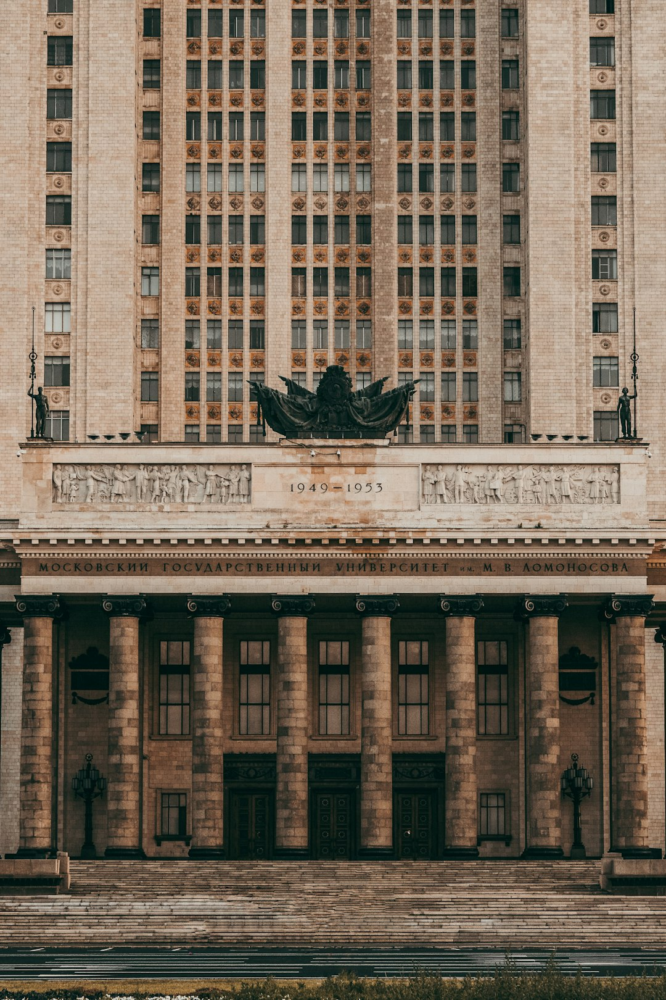

0.298  testify  ->  /content/clip_images/clip_images/testify.jpg


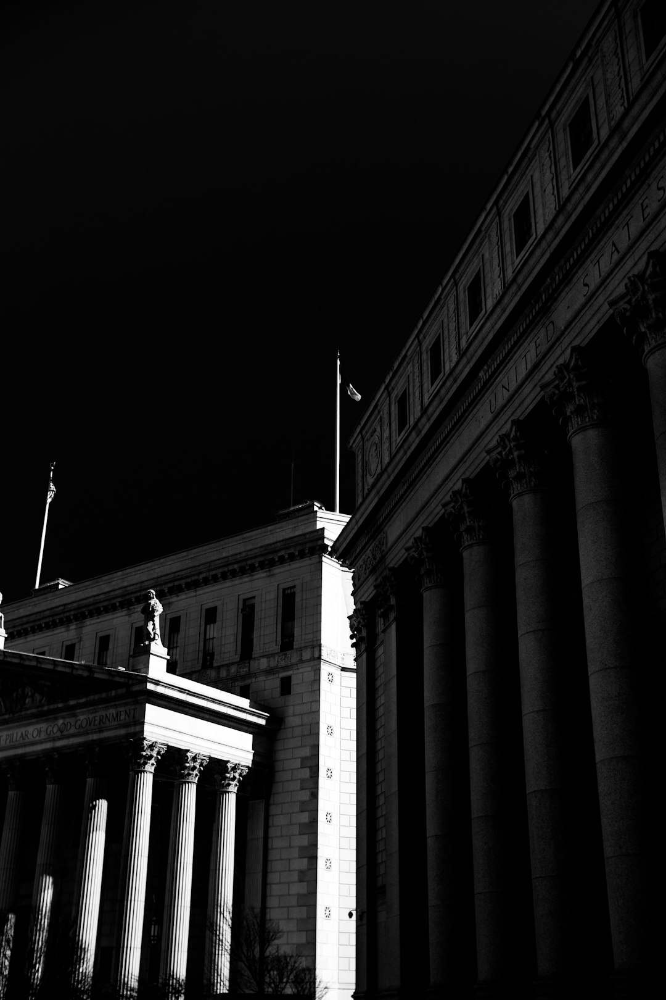

0.292  resignation  ->  /content/clip_images/clip_images/resignation.jpg


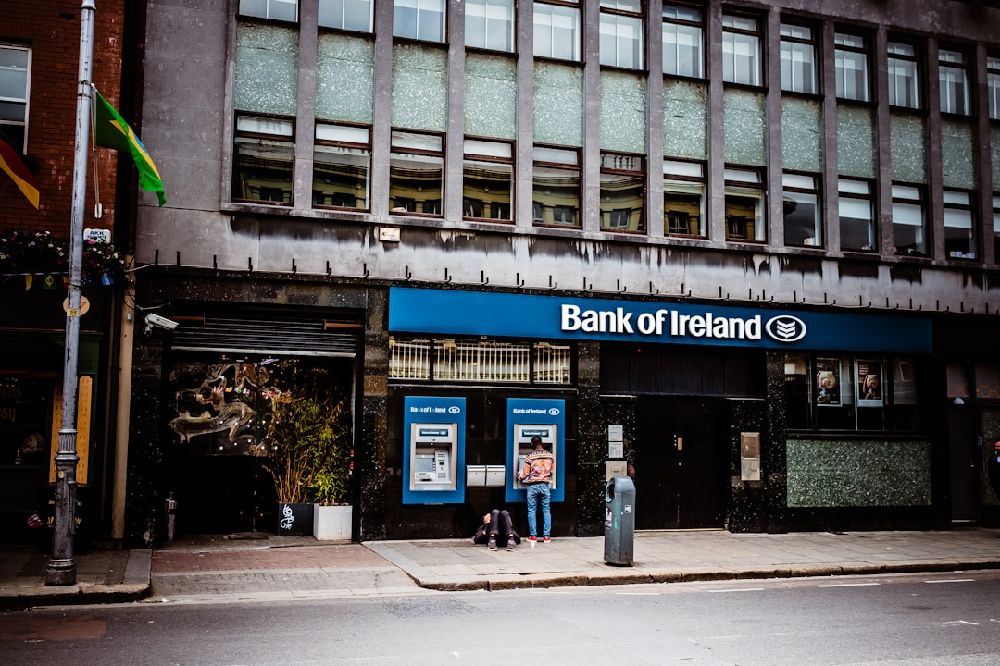

0.290  argentine  ->  /content/clip_images/clip_images/argentine.jpg


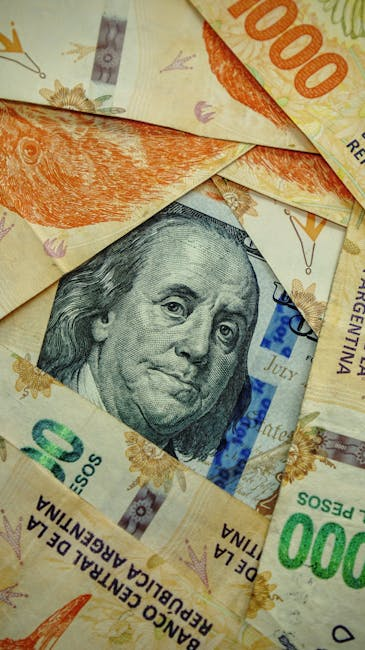

0.289  niftybank  ->  /content/clip_images/clip_images/niftybank.jpg


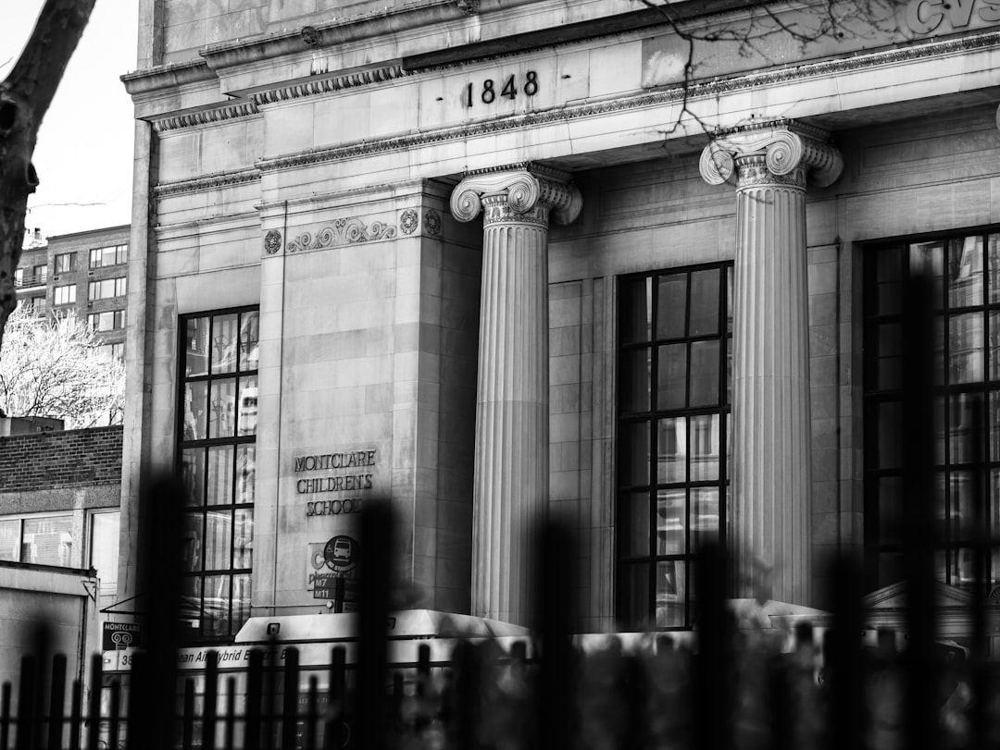

0.287  muhurat  ->  /content/clip_images/clip_images/muhurat.jpg


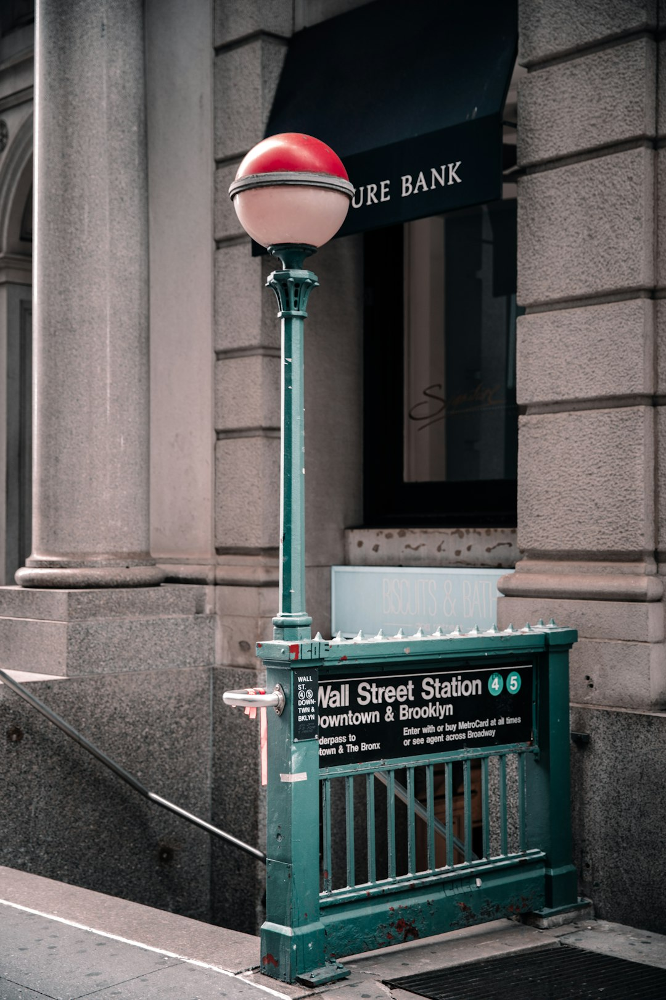

In [ ]:
# === Summarize (Model_04) + Retrieve images + Display ===
import torch
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
from PIL import Image
import IPython.display as disp

# --- Load summarizer (reuse if already loaded) ---
device = "cuda" if torch.cuda.is_available() else "cpu"
SAVE_DIR = "Model_04_version_01"  # change if you renamed the folder/zip

def _load_model04_if_needed():
    global tokenizer, model
    try:
        _ = tokenizer, model  # already defined earlier?
    except NameError:
        tokenizer = AutoTokenizer.from_pretrained(SAVE_DIR, use_fast=True)
        model = AutoModelForSeq2SeqLM.from_pretrained(SAVE_DIR).to(device).eval()
    return tokenizer, model

# --- Generation defaults matched to training/eval ---
GEN_KWARGS = dict(
    max_length=72,
    min_length=16,
    num_beams=4,
    no_repeat_ngram_size=3,
    length_penalty=1.0,
    early_stopping=True,
)

def summarize_text(text: str) -> str:
    tok, mdl = _load_model04_if_needed()
    batch = tok([text], max_length=512, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        out = mdl.generate(**batch, **GEN_KWARGS)
    return tok.batch_decode(out, skip_special_tokens=True)[0].strip()

# --- Uses retrieve_for_text(...) you defined earlier (CLIP index already loaded) ---
def run_pipeline(article_text: str, k: int = 6, show: bool = True):
    summary = summarize_text(article_text)
    print("\nSUMMARY:\n", summary)

    # Use summary as the CLIP text query
    results = retrieve_for_text(summary, top_k=k)

    print("\nTop matches:")
    for r in results:
        print(f"{r['score']:.3f}  {r['keyword']}  ->  {r['path']}")
        if show and r["path"]:
            try:
                img = Image.open(r["path"]).convert("RGB")
                disp.display(img)
            except Exception as e:
                print(f"[warn] could not open {r['path']}: {e}")
    return summary, results

# --- Quick test ---
example_article = """
The central bank raised interest rates by 25 bps amid persistent inflation,
stocks slipped while bank shares outperformed on margin expectations.
"""
_ = run_pipeline(example_article, k=6)



===== SOURCE (truncated) =====
representative image housing sales may have increased by 14 percent in the first nine months of the year but are yet to reach pre-demonetisation levels. the office segment, on the other hand, witnessed robust 40 percent growth in net absorption during the same period at 33 mn sq ft, according to a new report. residential sales failed to touch the levels seen in the pre-demonetisation era, when nearly 120,000 units were sold across the top seven markets, jll's india real estate market update q3 2019 said. compared to this, the top seven markets during the january-september period of this year w...

===== REFERENCE SUMMARY =====
housing sales have increased by 14 percent in the first nine months of the year. but the office segment saw robust 40 percent growth in net absorption. mumbai and bengaluru continued to dominate new launches. the third quarter of 2019 saw a moderate decline in new launches of 4 percent. a total of 88,500 units were sold in the top 

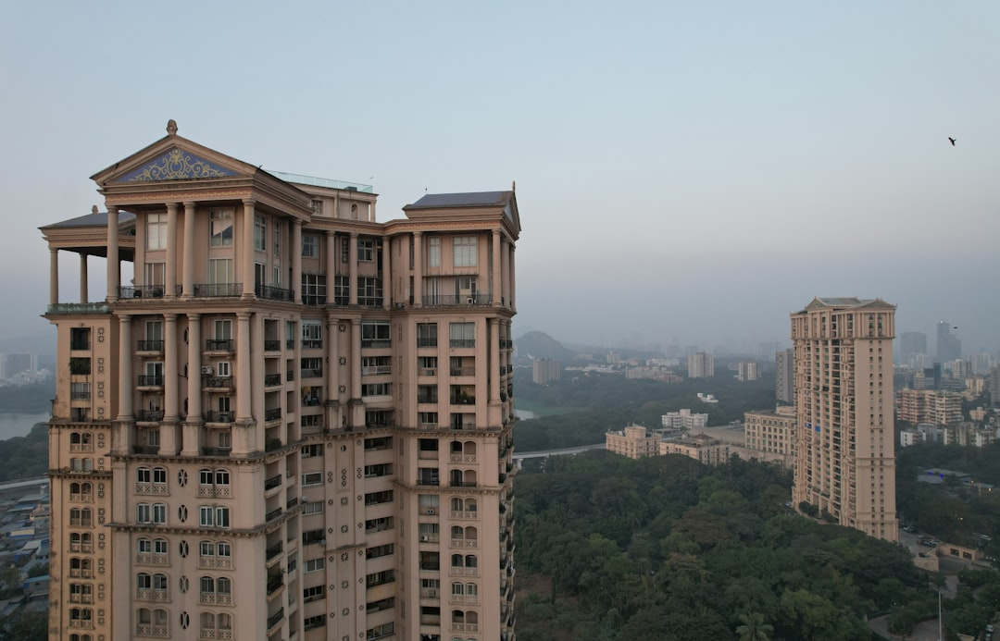

0.308  hdb  ->  /content/clip_images/clip_images/hdb.jpg


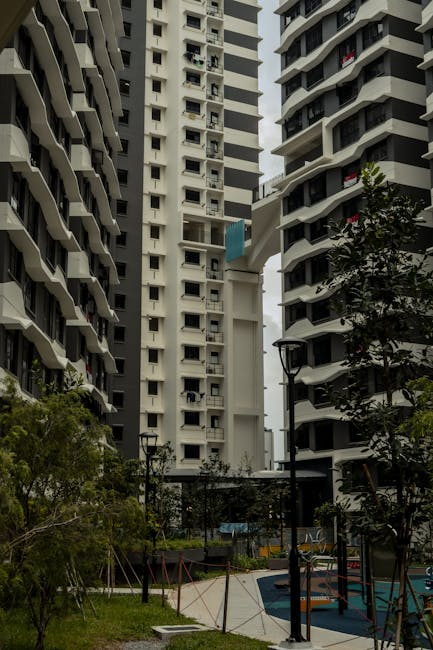

0.291  buildcon  ->  /content/clip_images/clip_images/buildcon.jpg


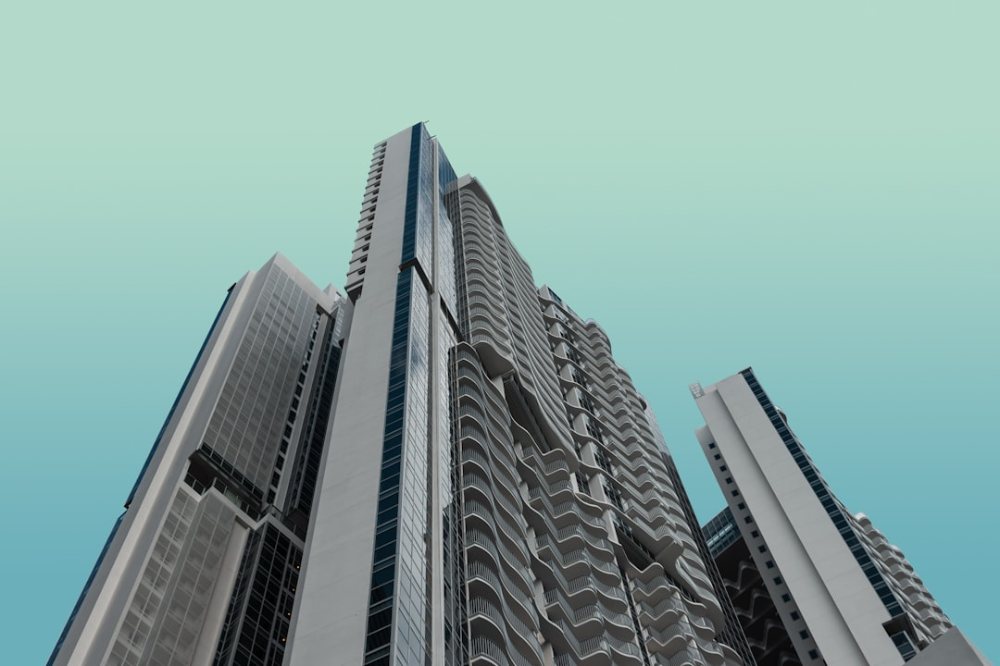

0.288  renewed  ->  /content/clip_images/clip_images/renewed.jpg


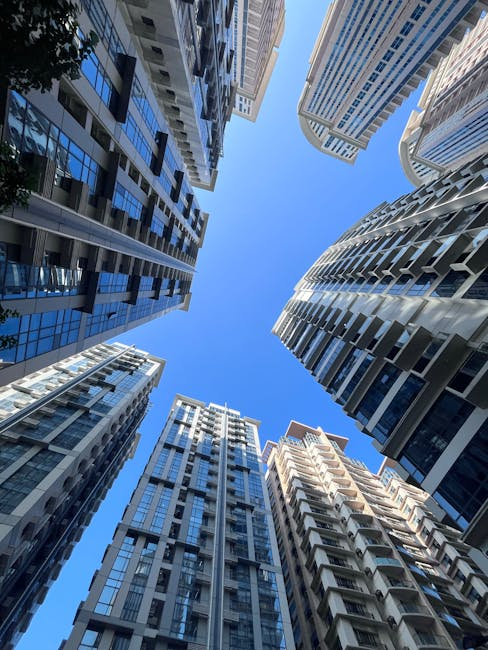

0.287  closing  ->  /content/clip_images/clip_images/closing.jpg


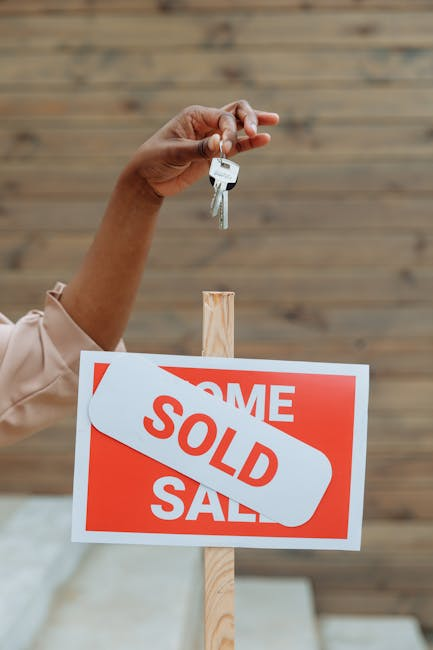

0.287  ahmedabad  ->  /content/clip_images/clip_images/ahmedabad.jpg


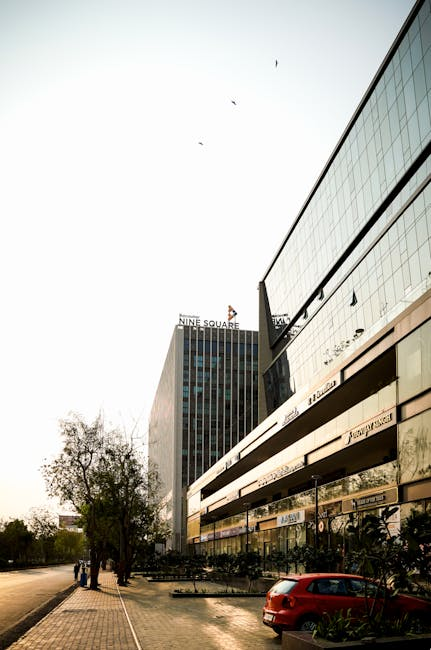

In [ ]:
# === Run on a sample from your dataset: show SOURCE, SUMMARY (model), and images ===
import random
from PIL import Image
import IPython.display as disp

def sample_from_dataset():
    """
    Returns (source_text, ref_summary) from your validation split.
    Supports either:
      - Hugging Face Dataset: val_dataset with 'Content'/'Summary' columns, or
      - Pandas DataFrame: val_df with 'Content'/'Summary' columns.
    """
    if 'val_dataset' in globals() and hasattr(val_dataset, 'column_names'):
        assert 'Content' in val_dataset.column_names and 'Summary' in val_dataset.column_names, "val_dataset must have 'Content' and 'Summary'."
        i = random.randrange(len(val_dataset))
        row = val_dataset[i]
        return row['Content'], row['Summary']
    elif 'val_df' in globals():
        assert 'Content' in val_df.columns and 'Summary' in val_df.columns, "val_df must have 'Content' and 'Summary'."
        i = random.randrange(len(val_df))
        row = val_df.iloc[i]
        return row['Content'], row['Summary']
    else:
        raise RuntimeError("Couldn't find val_dataset or val_df with 'Content'/'Summary' columns.")

def run_pipeline_on_sample(k: int = 6, show_images: bool = True, preview_chars: int = 600):
    # 1) Get a sample from dataset
    source_text, ref = sample_from_dataset()

    # 2) Summarize with Model_04
    summary = summarize_text(source_text)

    # 3) Retrieve images from CLIP index using the summary as the query
    results = retrieve_for_text(summary, top_k=k)

    # 4) Display everything
    print("\n===== SOURCE (truncated) =====")
    print((source_text[:preview_chars] + ("..." if len(source_text) > preview_chars else "")))
    print("\n===== REFERENCE SUMMARY =====")
    print(ref)
    print("\n===== MODEL SUMMARY =====")
    print(summary)

    print("\n===== TOP MATCHED IMAGES =====")
    for r in results:
        print(f"{r['score']:.3f}  {r['keyword']}  ->  {r['path']}")
        if show_images and r["path"]:
            try:
                img = Image.open(r["path"]).convert("RGB")
                disp.display(img)
            except Exception as e:
                print(f"[warn] could not open {r['path']}: {e}")
    return {"source": source_text, "reference": ref, "summary": summary, "results": results}


_ = run_pipeline_on_sample(k=6, show_images=True)


In [ ]:
# This is the enhanced CLIP retrieval function. it takes the text summary from my summarization model,
# expands the query with relevant domain terms (cities, real estate keywords, numbers),
# and then searches my image index for the most relevant matches.
# I also re-rank results, boost scores when the keyword appears in the query,
# remove duplicates by filename stem, and drop low-scoring results.

import os
import re

# Domain-specific keywords to improve recall
CITY_TERMS = ["Mumbai","Bengaluru","Bangalore","Delhi NCR","Pune","Hyderabad",
              "Chennai","Ahmedabad","Kolkata","Noida","Gurugram","India"]
REAL_ESTATE_TERMS = ["real estate","housing","apartments","condominiums","office",
                     "commercial","net absorption","sales","launches","construction",
                     "property","builders","developers","mortgage"]

def expand_query_from_summary(summary: str) -> str:
    # Extract numbers to help retrieval (e.g., years, percentages)
    nums = re.findall(r"\b\d+(?:\.\d+)?\b", summary)
    add = " ".join(nums[:6])
    q = " ".join([summary] + REAL_ESTATE_TERMS + CITY_TERMS + ([add] if add else []))
    return q

def retrieve_better(summary: str, top_k: int = 6, overfetch: int = 24, min_score: float = 0.25):
    # Step 1: Expand the query
    q = expand_query_from_summary(summary)

    # Step 2: Retrieve a large pool of candidates using my loaded CLIP index
    raw = retrieve_for_text(q, top_k=overfetch)

    # Step 3: Small boost for keyword matches in query
    q_low = q.lower()
    for r in raw:
        kw = r.get("keyword","").lower()
        r["score"] = float(r["score"])
        if kw and kw in q_low:
            r["score"] += 0.05

    # Step 4: Sort by score and deduplicate by filename
    seen = set(); results = []
    for r in sorted(raw, key=lambda x: x["score"], reverse=True):
        if r["score"] < min_score:
            continue
        stem = os.path.splitext(os.path.basename(r.get("path","")))[0]
        if stem in seen:
            continue
        seen.add(stem)
        results.append(r)
        if len(results) >= top_k:
            break
    return results

# Main pipeline: summarize → retrieve images → display results
from PIL import Image
import IPython.display as disp

def run_pipeline(article_text: str, k: int = 6, show: bool = True):
    # Run my summarization model on the article text
    summary = summarize_text(article_text)
    print("\nSUMMARY:\n", summary)

    # Retrieve top-k images for the generated summary
    results = retrieve_better(summary, top_k=k)

    print("\nTop matches:")
    for r in results:
        print(f"{r['score']:.3f}  {r['keyword']}  ->  {r['path']}")
        if show and r.get("path"):
            try:
                img = Image.open(r["path"]).convert("RGB")
                disp.display(img)
            except Exception as e:
                print(f"[warn] could not open {r['path']}: {e}")
    return summary, results


In [ ]:
# This function takes:
# - the original text
# - my model's summary
# - the retrieved images from the image retrieval model
# …and creates a clean one-page PDF slide with source text, summary, and a grid of image thumbnails.

!pip -q install reportlab

from reportlab.lib.pagesizes import A4
from reportlab.lib.units import cm
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
from textwrap import wrap

def make_pdf_slide(source_text: str, model_summary: str, results: list, out_path: str = "/content/summary_retrieval_report.pdf"):
    W, H = A4
    margin = 1.2*cm
    c = canvas.Canvas(out_path, pagesize=A4)
    y = H - margin

    # Title
    c.setFont("Helvetica-Bold", 16)
    c.drawString(margin, y, "News Summary + Image Retrieval")
    y -= 0.8*cm

    # SOURCE text (truncated)
    c.setFont("Helvetica-Bold", 11)
    c.drawString(margin, y, "SOURCE (truncated):")
    y -= 0.5*cm
    c.setFont("Helvetica", 10)
    for line in wrap(source_text, width=120)[:10]:
        c.drawString(margin, y, line)
        y -= 0.38*cm

    # Model Summary
    y -= 0.3*cm
    c.setFont("Helvetica-Bold", 11)
    c.drawString(margin, y, "MODEL SUMMARY:")
    y -= 0.5*cm
    c.setFont("Helvetica", 10)
    for line in wrap(model_summary, width=120)[:6]:
        c.drawString(margin, y, line)
        y -= 0.38*cm

    # Top images
    y -= 0.4*cm
    c.setFont("Helvetica-Bold", 11)
    c.drawString(margin, y, "Top Images:")
    y -= 0.5*cm

    # Grid of 3x2 thumbnails
    thumb_w = (W - 2*margin - 2*0.5*cm) / 3
    thumb_h = 4.0*cm
    col_gap = 0.5*cm
    row_gap = 0.6*cm
    i = 0
    for r in range(2):  # 2 rows
        for col in range(3):  # 3 columns
            if i >= len(results): break
            item = results[i]; i += 1
            px = margin + col*(thumb_w + col_gap)
            py = y - r*(thumb_h + row_gap)
            try:
                img = ImageReader(item["path"])
                c.drawImage(img, px, py-thumb_h, width=thumb_w, height=thumb_h, preserveAspectRatio=True, anchor='n')
                # Caption
                c.setFont("Helvetica", 8)
                caption = f"{item['keyword']}  ({item['score']:.3f})"
                c.drawString(px, py-thumb_h-0.35*cm, caption[:60])
            except:
                c.setFont("Helvetica", 8)
                c.drawString(px, py-0.3*cm, f"[error loading image]")

    c.showPage()
    c.save()
    print(f"✅ PDF saved to: {out_path}")

# Helper: pick a sample, run pipeline, and export PDF
def run_and_export_pdf(k=6, out="/content/summary_retrieval_report.pdf"):
    if 'val_dataset' in globals() and hasattr(val_dataset, 'column_names'):
        row = val_dataset[random.randrange(len(val_dataset))]
        source_text = row['Content']
    else:
        row = val_df.sample(1).iloc[0]
        source_text = row['Content']

    summary, results = run_pipeline(source_text, k=k, show=False)
    make_pdf_slide(source_text, summary, results, out_path=out)

# Run once
run_and_export_pdf(k=6)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 21.8 MB/s eta 0:00:00

SUMMARY:
 the government is expected to cut corporate taxes to 25% from the current 35%. the move will bring more companies into the tax bracket, but it will still impact the revenues of the government. the government is already expected to widen to 3.5% during fy18 breaching the target of 3.2%. a populist budget is unlikely to be

Top matches:
0.339  ahmedabad  ->  /content/clip_images/clip_images/ahmedabad.jpg
0.334  construction  ->  /content/clip_images/clip_images/construction.jpg
0.300  levy  ->  /content/clip_images/clip_images/levy.jpg
0.300  regulation  ->  /content/clip_images/clip_images/regulation.jpg
0.296  thomson  ->  /content/clip_images/clip_images/thomson.jpg
0.290  hexaware  ->  /content/clip_images/clip_images/hexaware.jpg
✅ PDF saved to: /content/summary_retrieval_report.pdf


In [ ]:
# I create a corporate-clean PDF deck (A4) with title, footer, and page numbers.
!pip -q install reportlab

from reportlab.lib.pagesizes import A4
from reportlab.lib.units import cm
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
from reportlab.lib import colors
from textwrap import wrap
import random, os

# My slide theme
PAGE_SIZE = A4
MARGIN = 1.2*cm
TITLE_COLOR = colors.HexColor("#0F172A")   # slate-900
ACCENT_COLOR = colors.HexColor("#2563EB")  # blue-600
BODY_COLOR = colors.HexColor("#111827")    # gray-900
LINE_GRAY = colors.HexColor("#E5E7EB")     # gray-200

# Optional: set this to a local PNG path to brand the deck
LOGO_PATH = None  # e.g., "/content/logo.png"

def _draw_header(c, title_text):
    W, H = PAGE_SIZE
    c.setFillColor(ACCENT_COLOR)
    c.rect(0, H-0.8*cm, W, 0.8*cm, stroke=0, fill=1)
    if LOGO_PATH and os.path.exists(LOGO_PATH):
        try:
            c.drawImage(ImageReader(LOGO_PATH), MARGIN, H-0.7*cm, width=2.2*cm, height=0.6*cm, mask='auto')
        except: pass
    c.setFillColor(colors.white)
    c.setFont("Helvetica-Bold", 13)
    c.drawString(MARGIN + (2.5*cm if LOGO_PATH else 0), H-0.55*cm, title_text)

def _draw_footer(c, page_num):
    W, H = PAGE_SIZE
    c.setFillColor(LINE_GRAY); c.rect(0, 0.8*cm, W, 0.05*cm, stroke=0, fill=1)
    c.setFillColor(colors.HexColor("#6B7280"))  # gray-500
    c.setFont("Helvetica", 9)
    c.drawRightString(W - MARGIN, 0.45*cm, f"Page {page_num}")

def _text_box(c, x, y, text, width_chars=118, max_lines=10, font="Helvetica", size=10, color=BODY_COLOR, leading=0.38*cm):
    c.setFont(font, size); c.setFillColor(color)
    for i, line in enumerate(wrap(text, width=width_chars)[:max_lines]):
        c.drawString(x, y - i*leading, line)
    return y - max_lines*leading


In [ ]:
# === PDF Deck (ReportLab) — uses current HF CLIP helpers ===
import os, random
from PIL import Image
from reportlab.lib.units import cm
from reportlab.lib.utils import ImageReader
from reportlab.lib import colors
from reportlab.pdfgen import canvas

# Assumes these exist from earlier cells:
# - PAGE_SIZE, MARGIN, TITLE_COLOR, BODY_COLOR
# - _draw_header(c, title), _draw_footer(c, page), _text_box(c, x, y, text, width_chars, max_lines)
# - summarize_text(text)
# - retrieve_for_text(text, top_k)  # HF CLIP version using get_text_features
# (optional) retrieve_better(summary, top_k, overfetch, min_score)
# - val_dataset / val_df / df (to sample from)

def _image_grid(c, items, start_x, start_y, cols=3, rows=2, w=None, h=None, gap_x=0.5*cm, gap_y=0.6*cm):
    W, H = PAGE_SIZE
    if w is None:
        w = (W - 2*MARGIN - (cols-1)*gap_x) / cols
    if h is None:
        h = 4.0*cm
    idx = 0
    c.setFillColor(BODY_COLOR); c.setFont("Helvetica", 8)
    for r in range(rows):
        for col in range(cols):
            if idx >= len(items):
                return
            it = items[idx]; idx += 1
            px = start_x + col*(w + gap_x)
            py = start_y - r*(h + gap_y)
            try:
                c.drawImage(ImageReader(it["path"]), px, py-h, width=w, height=h,
                            preserveAspectRatio=True, anchor='n', mask='auto')
                caption = f"{it.get('keyword','') or os.path.splitext(os.path.basename(it.get('path','')))[0]}  ({it.get('score',0.0):.3f})"
                c.drawString(px, py-h-0.35*cm, caption[:70])
            except Exception:
                c.drawString(px, py-0.3*cm, f"[image error] {os.path.basename(it.get('path',''))}")

def _pick_sample():
    # Try HF Dataset first
    if 'val_dataset' in globals():
        i = random.randrange(len(val_dataset))
        row = val_dataset[i]
        return row['Content'], row.get('Summary', "")
    # Then pandas splits
    if 'val_df' in globals():
        r = val_df.sample(1).iloc[0]
        return r['Content'], r.get('Summary', "")
    if 'df' in globals():
        r = df.sample(1).iloc[0]
        src = r.get('Content', r.get('text', ''))
        ref = r.get('Summary', r.get('summary', ''))
        return src, ref
    raise RuntimeError("No dataset found. Load val_dataset/val_df/df first.")

def _retrieve_topk(summary_text, k):
    # Prefer smarter retrieval if defined; else use base retriever
    if 'retrieve_better' in globals():
        return retrieve_better(summary_text, top_k=k)
    return retrieve_for_text(summary_text, top_k=k)

def make_deck(n_slides=6, out_path="/content/News_Summary_Deck.pdf", k=6, title="News Summary + Image Retrieval"):
    c = canvas.Canvas(out_path, pagesize=PAGE_SIZE)
    page = 1

    # Title page
    _draw_header(c, title)
    c.setFillColor(TITLE_COLOR); c.setFont("Helvetica-Bold", 24)
    c.drawString(MARGIN, PAGE_SIZE[1]-2.8*cm, "Automated Summarization & Image Retrieval")
    c.setFont("Helvetica", 12); c.setFillColor(colors.HexColor("#374151"))
    c.drawString(MARGIN, PAGE_SIZE[1]-3.6*cm, "Model_04 (DistilBART) + CLIP Retrieval • Generated automatically")
    _draw_footer(c, page); c.showPage(); page += 1

    for _ in range(n_slides):
        source_text, _ = _pick_sample()
        summary = summarize_text(source_text)
        results = _retrieve_topk(summary, k=k)

        _draw_header(c, title)

        # SOURCE
        x, y = MARGIN, PAGE_SIZE[1]-2.2*cm
        c.setFillColor(TITLE_COLOR); c.setFont("Helvetica-Bold", 12); c.drawString(x, y, "SOURCE (truncated)")
        y -= 0.5*cm
        y = _text_box(c, x, y, source_text, width_chars=118, max_lines=10)

        # SUMMARY
        y -= 0.3*cm
        c.setFillColor(TITLE_COLOR); c.setFont("Helvetica-Bold", 12); c.drawString(x, y, "MODEL SUMMARY")
        y -= 0.5*cm
        y = _text_box(c, x, y, summary, width_chars=118, max_lines=6)

        # IMAGES
        y -= 0.4*cm
        c.setFillColor(TITLE_COLOR); c.setFont("Helvetica-Bold", 12); c.drawString(x, y, "Top Images")
        y -= 0.5*cm
        _image_grid(c, results, start_x=x, start_y=y, cols=3, rows=2)

        _draw_footer(c, page)
        c.showPage(); page += 1

    c.save()
    print(f"✅ Deck saved to: {out_path}")

# Build a 6-slide deck and download
make_deck(n_slides=6, out_path="/content/News_Summary_Deck.pdf", k=6)

# Download in Colab
from google.colab import files
files.download("/content/News_Summary_Deck.pdf")


NameError: name 'PAGE_SIZE' is not defined